In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import cv2
from skimage import io

import tensorflow as tf
from tensorflow import keras
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers.legacy import Adam
from keras.preprocessing.image import ImageDataGenerator

import plotly.express as px

import random
import glob
from sklearn.preprocessing import StandardScaler, normalize
from IPython.display import display

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# 1. Importing the Dataset

In [2]:
# Make objects with the images and masks. 
brain_scans = []
mask_files = glob.glob('../input/lgg-mri-segmentation/kaggle_3m/*/*_mask*')

for i in mask_files:
    brain_scans.append(i.replace('_mask',''))

print(brain_scans[:10])
print(mask_files[:10])

['../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_56.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_8.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_34.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_33.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_43.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_39.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_7.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_31.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_6.tif', '../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_38.tif']
['../input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_1986030

## 1.2 Creating the final data frame:¶
In this section we will combine the brain scans with their corresponding 'masks' in a dataframe. Next, we use a function to determine which masks contain a tumor and which masks are empty.

Then we apply the function to the masks in the dataframe and add a column with 0's and 1's, where 0 indicate a mask with no tumor and 1 indicate a mask with a tumor. This dataframe is needed for the classification task, because then the model can get the brain scans as input and train the column with the 0's and 1's as output.

In [3]:
# Make a dataframe with the images and their corresponding masks
img_df = pd.DataFrame({
    "image_path":brain_scans,
    "mask_path":mask_files
})

In [4]:
# Make a function that search for the largest pixel value in the masks, because that will indicate if the image have 
# a corresponding mask with a tumor or not. 
def positive_negative_diagnosis(file_masks):
    mask = cv2.imread(file_masks)
    value = np.max(mask)
    if value > 0:
        return 1
    else:
        return 0
    
# Apply the function to the masks and return back a column with 1 and zeros, where 0 indicate no tumor and 1 a tumor. 
img_df["Tumor"] = img_df["mask_path"].apply(lambda x: positive_negative_diagnosis(x)) 

In [5]:
img_df # showing the data

,image_path,mask_path,Tumor
0,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
1,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
2,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1
3,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1
4,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1
...,...,...,...
3924,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
3925,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
3926,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
3927,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0


# 2. Data Visualization

In [6]:
# How many non-tumors (0) and tumors (1) are in the data
img_df['Tumor'].value_counts()

Tumor
0    2556
1    1373
Name: count, dtype: int64

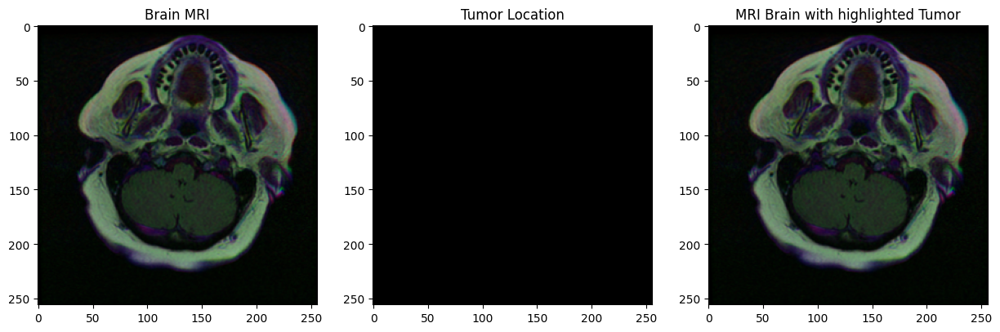

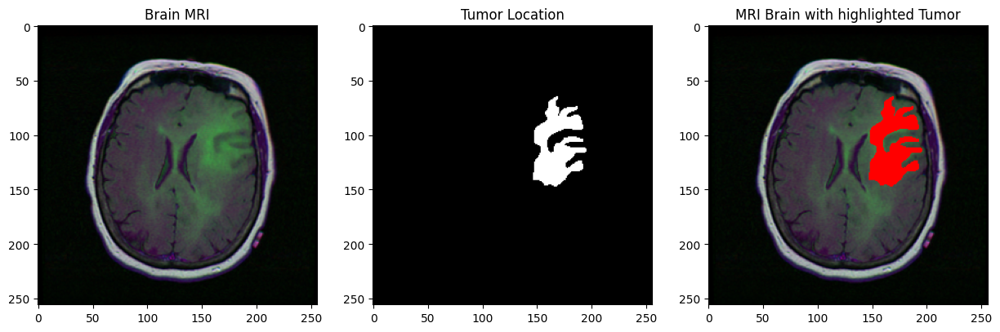

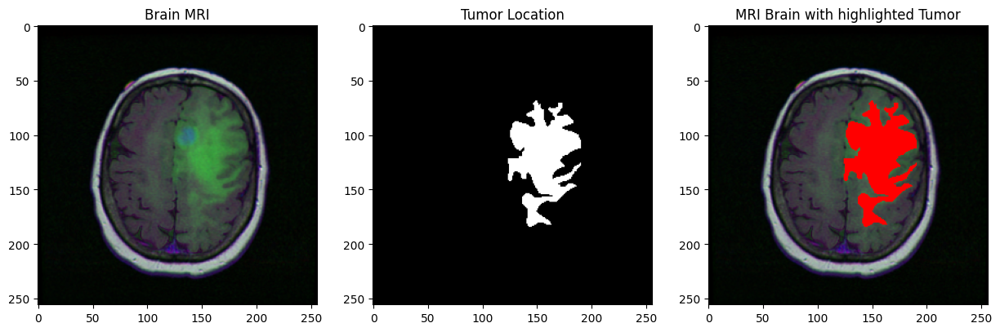

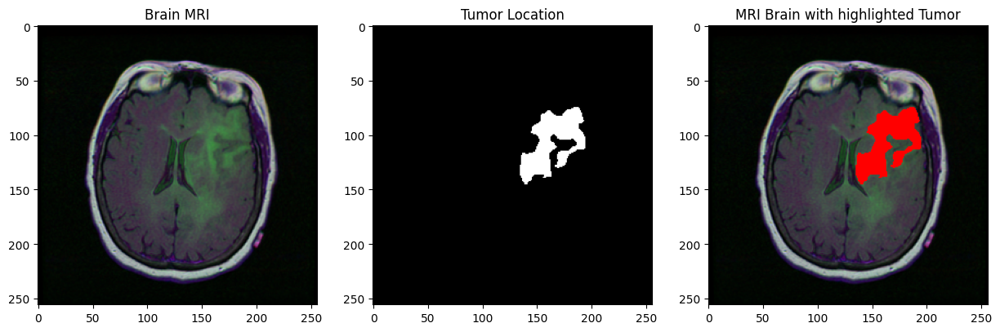

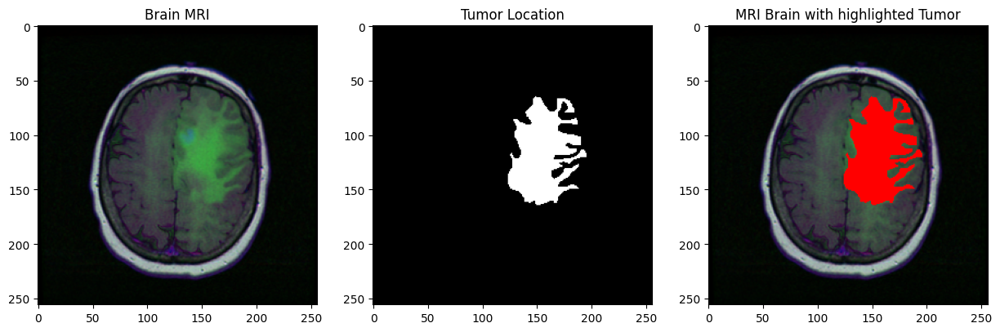

...

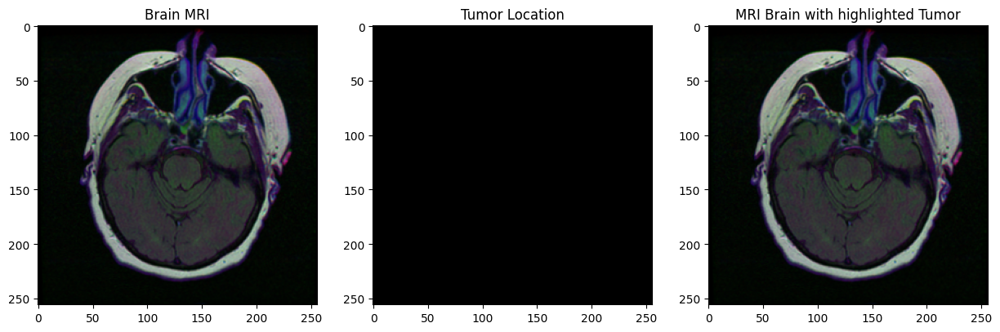

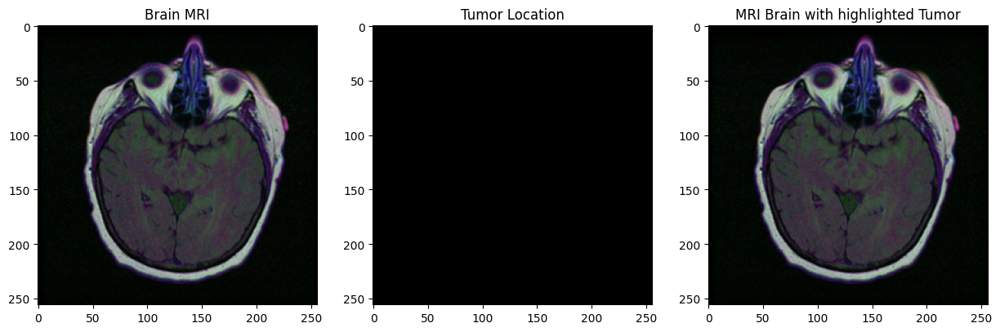

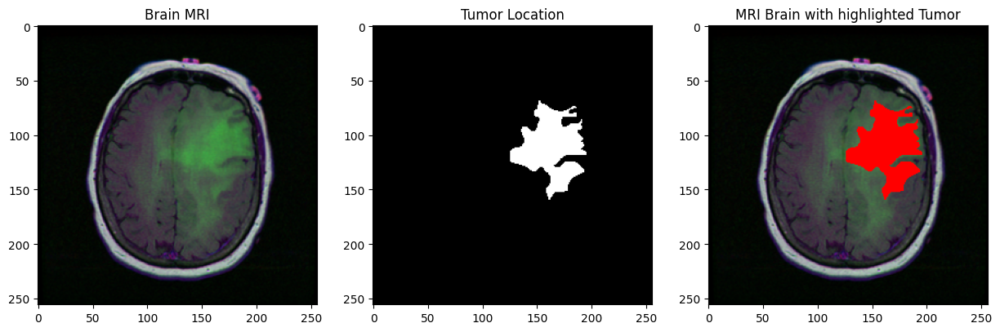

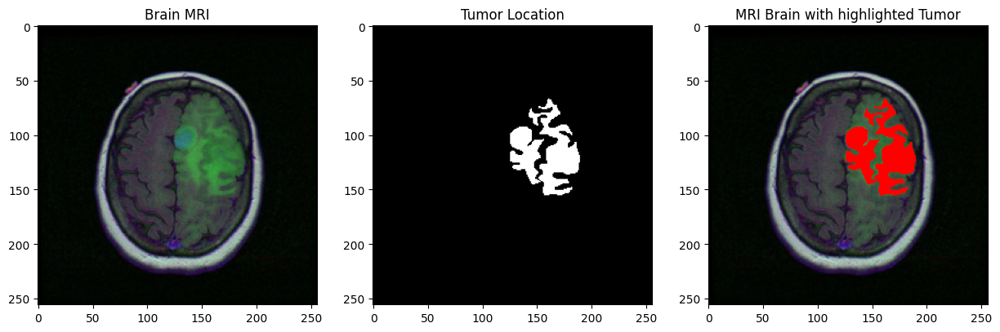

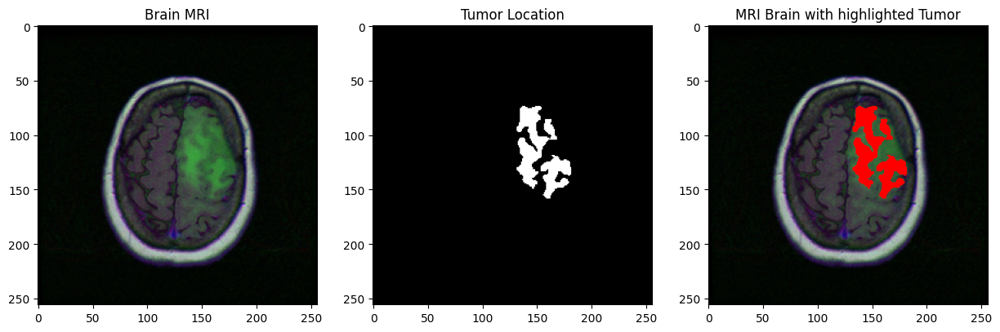

In [7]:
# Data vizualisation
# SOURCE: https://www.kaggle.com/monkira/brain-mri-segmentation-using-unet-keras#Create-data-frame-and-split-data-on-train-set,-validation-set-and-test-set
# https://www.kaggle.com/saivikassingamsetty/brain-tumor-segmentation-with-unet/notebook

for i in range(1,40, 2):
    img_path=brain_scans[i]
    msk_path=mask_files[i]
    img=cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    msk=cv2.imread(msk_path)

    #Plot the Brain MRI scans 
    original = img.copy()
    fig, ax = plt.subplots(1,3,figsize = (15,5))
    ax[0].imshow(original)
    ax[0].set_title("Brain MRI")
   
    # Plot the corresponding mask
    main = original.copy()
    mask = msk.copy()
    ax[1].imshow(mask)
    ax[1].set_title("Tumor Location")

    # Plot the Brain MRI scan with their mask
    main = original.copy()
    label = cv2.imread(msk_path)
    sample = np.array(np.squeeze(label), dtype = np.uint8)
    contours, hier = cv2.findContours(sample[:,:,0],cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    sample_over_gt = cv2.drawContours(main, contours, -1,[255,0,0], thickness=-1)
    ax[2].imshow(sample_over_gt)
    ax[2].set_title("MRI Brain with highlighted Tumor")

# 3. Spliting Training, Validation and Testing Data from Dataset

In [8]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(img_df,test_size = 0.1)
train, val = train_test_split(train,test_size = 0.2)
print(train.values.shape)
print(val.values.shape)
print(test.values.shape)

train.head()
val.head()

(2828, 3)
(708, 3)
(393, 3)


,image_path,mask_path,Tumor
3484,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
889,../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_H...,1
1948,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
688,../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_F...,0
585,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,../input/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0


In [9]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
img_df['Tumor'] = img_df['Tumor'].apply(lambda x: str(x))
img_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   Tumor       3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


# 4. Building a Segmentation Model


## 4.1 Data Augmentation, Genaration, Adjustment

In [10]:
# SOURCE: https://github.com/zhixuhao/unet/blob/master/data.py
def train_generator(data_frame, batch_size, aug_dict,
        image_color_mode="rgb",
        mask_color_mode="grayscale",
        image_save_prefix="image",
        mask_save_prefix="mask",
        save_to_dir=None,
        target_size=(256,256),
        seed=1):
    '''
    can generate image and mask at the same time use the same seed for
    image_datagen and mask_datagen to ensure the transformation for image
    and mask is the same if you want to visualize the results of generator,
    set save_to_dir = "your path"
    '''
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    
    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col = "image_path",
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)

    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col = "mask_path",
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)

    train_gen = zip(image_generator, mask_generator)
    
    for (img, mask) in train_gen:
        img, mask = adjust_data(img, mask)
        yield (img,mask)

def adjust_data(img,mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    
    return (img, mask)

In [11]:
EPOCHS = 100
BATCH_SIZE = 32
im_height = 256
im_width = 256

In [12]:
train_generator_args = dict(width_shift_range=0.05,
                            height_shift_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest'
                           )


train_gen = train_generator(train, BATCH_SIZE, 
                            train_generator_args, 
                            target_size=(im_height, 
                            im_width)
                           )


test_gen = train_generator(val, BATCH_SIZE, 
                            dict(), 
                            target_size=(im_height, im_width)
                            )

## 4.2 Defineing Loss Function and Metrics
In the code below we see that the maker of this code added a smooth value of 100 to the function of the dice coefficient. The reason for this is that the denominator of the dice coefficient is the sum of the predictions and real values, which can be zero. To avoid division by zero, it's necessary to add an extra value.

Source: https://www.kaggle.com/monkira/brain-mri-segmentation-using-unet-keras

In [13]:
smooth=100

def dice_coef(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)
    And=K.sum(y_truef* y_predf)
    return((2* And + smooth) / (K.sum(y_truef) + K.sum(y_predf) + smooth))

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def jac_distance(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)

    return - iou(y_true, y_pred)

In [14]:
def unet(input_size=(256,256,3)):
    
    # Input
    inputs = Input(input_size)
    
    # Stage 1 
    conv1 = Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    # Stage 2
    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    # Stage 3
    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    # Stage 4
    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    # Stage 5
    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation('relu')(bn5)

    # Upstage 1
    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    # Upstage 2
    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    # Upstage 3
    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    # Upstage 4
    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)

    # Output 
    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [15]:
model = unet()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 activation (Activation)        (None, 256, 256, 64  0           ['conv2d[0][0]']                 
                                )                                                             

## 5.1. Setting Hyperparameters and Data Augmentation

In [16]:
# Define reducelr function to reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=15,
                              min_delta=0.0001,
                              factor=0.2
                             )

# Define the earltstop function
earlystopping = EarlyStopping(monitor='val_loss',
                              min_delta=0.001,
                              mode='min', 
                              verbose=1, 
                              patience=20,
                              restore_best_weights = True
                             )

# Defining the Callbacks Function

checkpointer2 = [ModelCheckpoint('unet_brain_mri_seg.hdf5', verbose=1, save_best_only=True)]
callbacks = [checkpointer2, earlystopping, reduce_lr]

# 6. Training the Model

In [17]:
model = unet(input_size=(im_height, im_width, 3))


model.compile(optimizer='adam', loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

history = model.fit(train_gen,
                    steps_per_epoch = len(train) / BATCH_SIZE, 
                    epochs=EPOCHS, 
                    validation_data = test_gen,
                    validation_steps = len(val) / BATCH_SIZE,
                    callbacks = callbacks)

Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/100
89/88 [==============================] - ETA: 0s - loss: -0.2080 - binary_accuracy: 0.9447 - iou: 0.1211 - dice_coef: 0.2077Found 708 validated image filenames.
Found 708 validated image filenames.

Epoch 1: val_loss improved from inf to -0.02020, saving model to unet_brain_mri_seg.hdf5
88/88 [==============================] - 124s 1s/step - loss: -0.2080 - binary_accuracy: 0.9447 - iou: 0.1211 - dice_coef: 0.2077 - val_loss: -0.0202 - val_binary_accuracy: 0.9853 - val_iou: 0.0115 - val_dice_coef: 0.0222 - lr: 0.0010
Epoch 2/100
89/88 [==============================] - ETA: 0s - loss: -0.5342 - binary_accuracy: 0.9912 - iou: 0.3758 - dice_coef: 0.5342
Epoch 2: val_loss improved from -0.02020 to -0.02786, saving model to unet_brain_mri_seg.hdf5
88/88 [==============================] - 71s 800ms/step - loss: -0.5342 - binary_accuracy: 0.9912 - iou: 0.3758 - dice_coef: 0.5342 - val_loss: -0.0279 - val_

# 7. Segmentation Model Evaluation

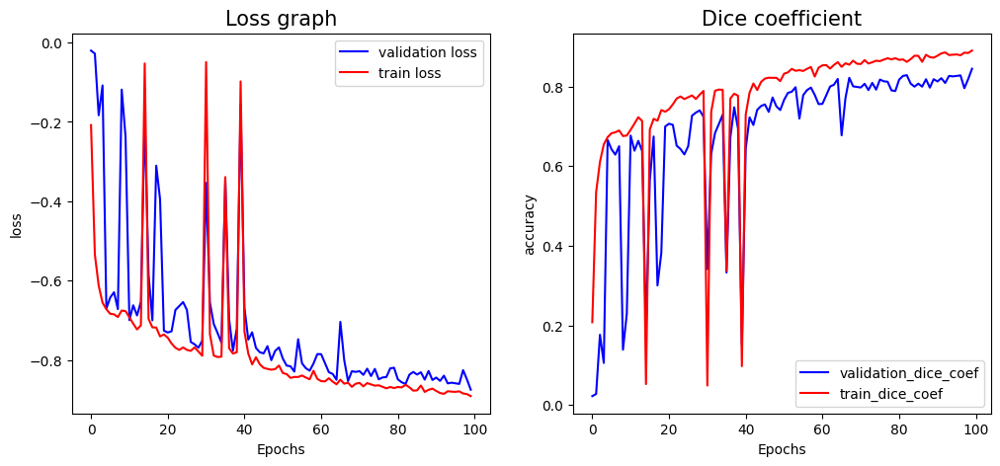

In [18]:
history = history.history

list_traindice = history['dice_coef']
list_valdice = history['val_dice_coef']

list_trainjaccard = history['iou']
list_valjaccard = history['val_iou']

list_trainloss = history['loss']
list_valloss = history['val_loss']

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(list_valloss, 'b-', label='validation loss')
plt.plot(list_trainloss,'r-', label='train loss')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.title('Loss graph', fontsize = 15)
plt.legend(['train', 'val'])
plt.legend(loc='best')

plt.subplot(1,2,2)
plt.plot(list_valdice, 'b-', label= 'validation_dice_coef')
plt.plot(list_traindice, 'r-', label= 'train_dice_coef')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.title('Dice coefficient', fontsize = 15)
plt.legend(['train', 'val'])
plt.legend(loc='best')
plt.show()

In [19]:
from tensorflow.keras.models import Model, load_model, save_model

model = load_model('unet_brain_mri_seg.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

In [20]:
test_gen = train_generator(test, 
                           BATCH_SIZE,
                           dict(),
                           target_size=(im_height, im_width))

results = model.evaluate(test_gen, 
                         steps=len(test) / BATCH_SIZE)

print("Test lost: ",results[0])
print("Test IOU: ",results[1])
print("Test Dice Coefficent: ",results[2])

Found 393 validated image filenames.
Found 393 validated image filenames.
12/12 [==============================] - 7s 530ms/step - loss: -0.8343 - binary_accuracy: 0.9756 - iou: 0.6907 - dice_coef: 0.7887
Test lost:  -0.8342660069465637
Test IOU:  0.9755969643592834
Test Dice Coefficent:  0.6907392144203186


1/1 [==============================] - 0s 27ms/step


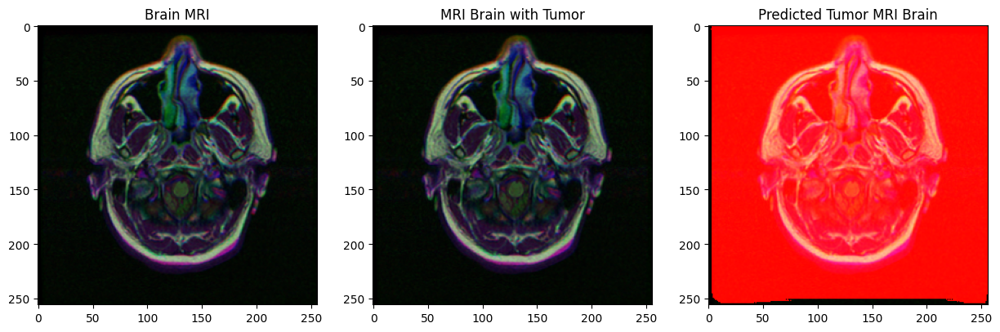

1/1 [==============================] - 0s 27ms/step


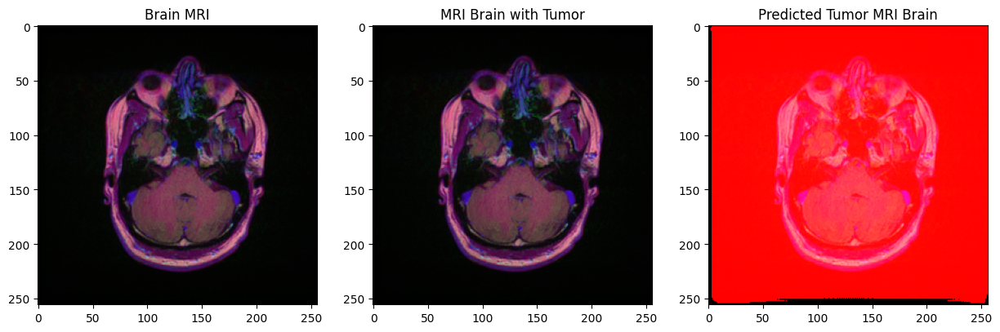

1/1 [==============================] - 0s 25ms/step


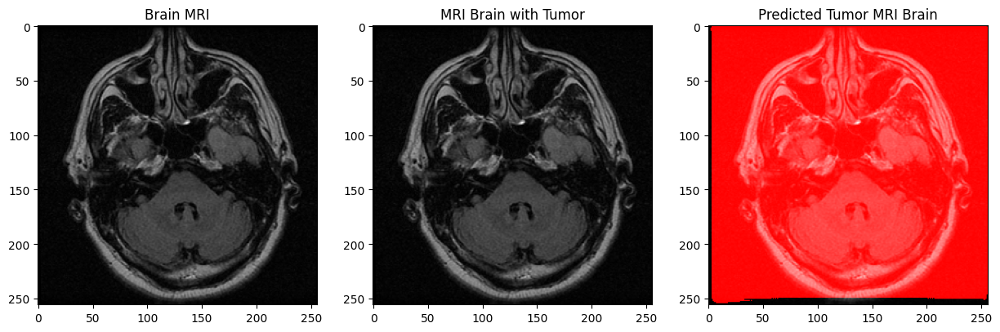

1/1 [==============================] - 0s 26ms/step


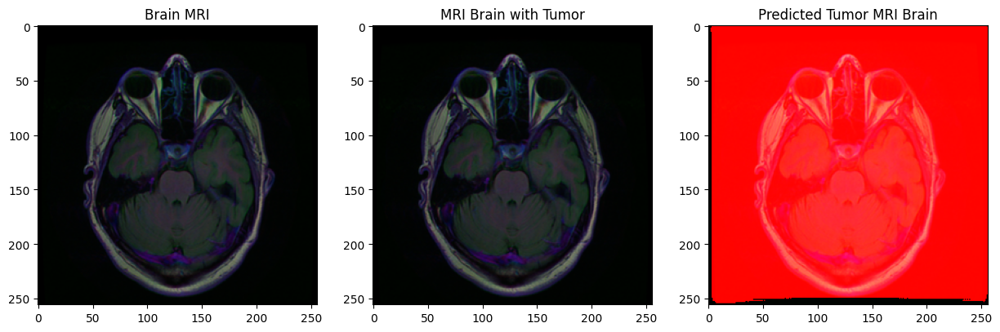

1/1 [==============================] - 0s 27ms/step


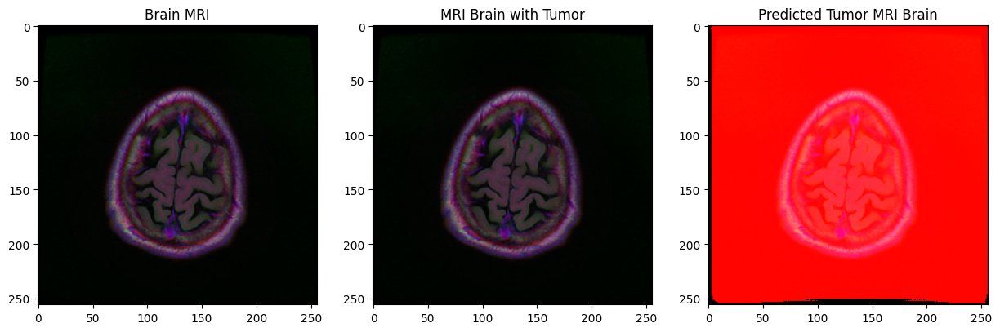

1/1 [==============================] - 0s 28ms/step


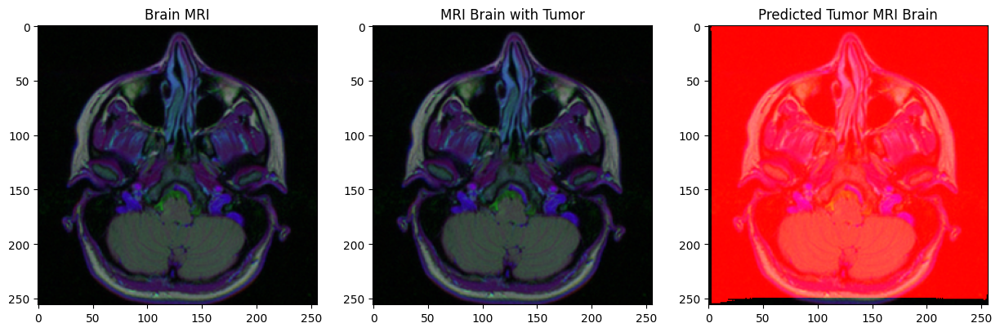

1/1 [==============================] - 0s 30ms/step


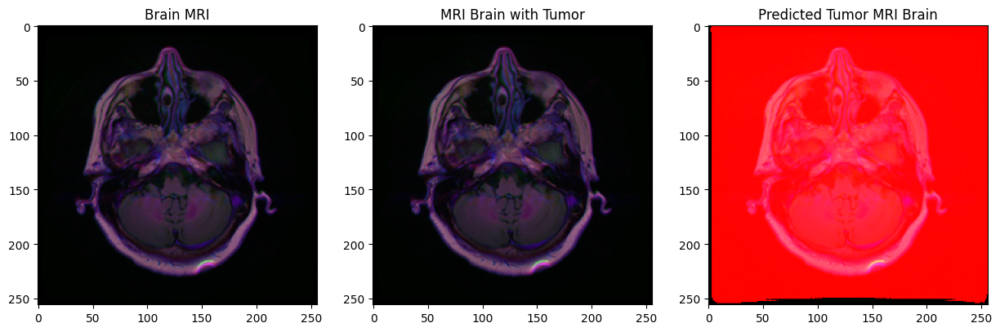

1/1 [==============================] - 0s 26ms/step


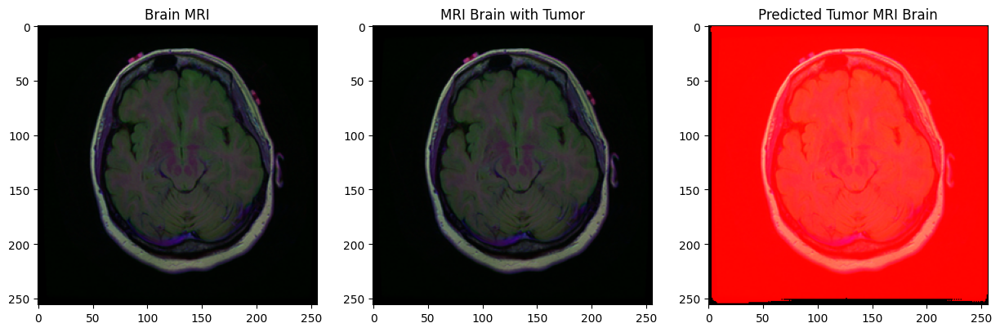

1/1 [==============================] - 0s 27ms/step


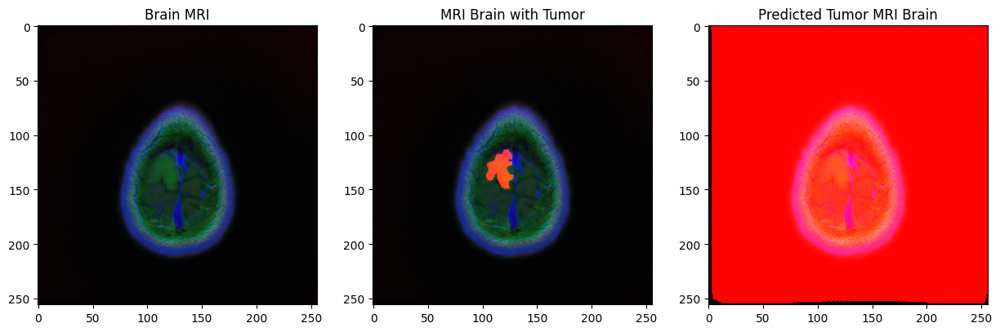

1/1 [==============================] - 0s 24ms/step


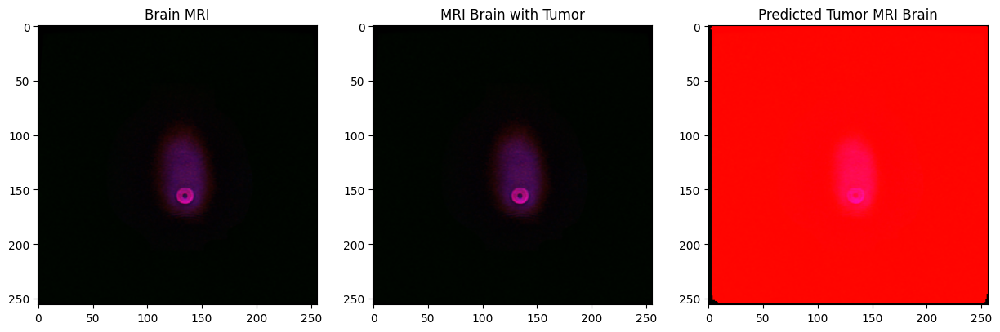

1/1 [==============================] - 0s 29ms/step


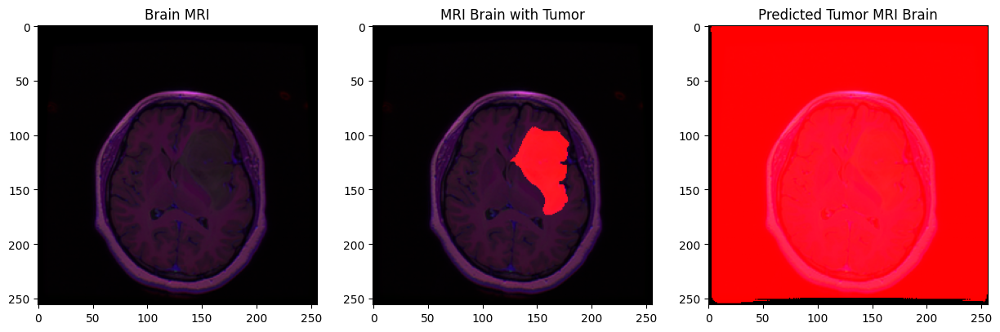

1/1 [==============================] - 0s 28ms/step


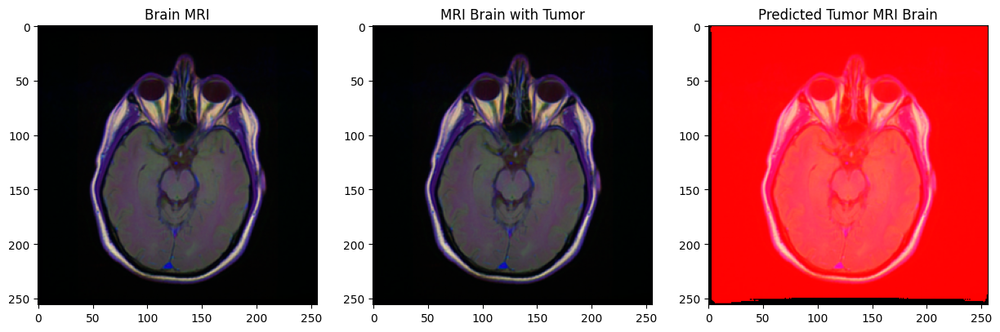

1/1 [==============================] - 0s 26ms/step


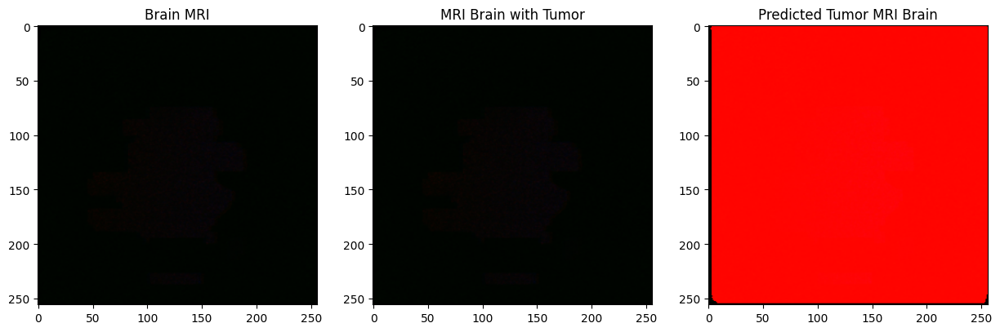

1/1 [==============================] - 0s 27ms/step


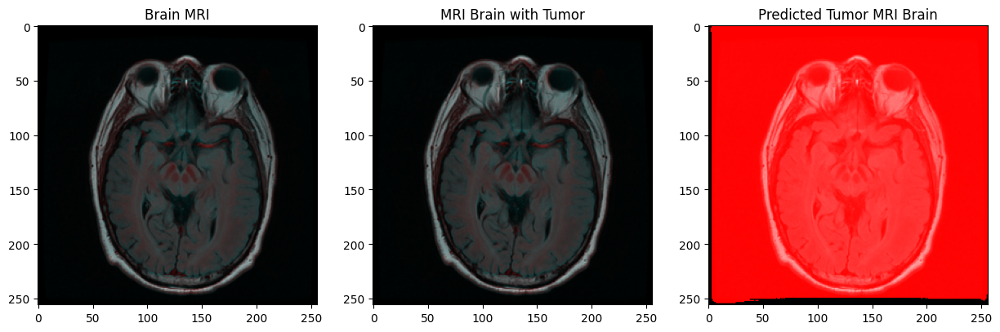

1/1 [==============================] - 0s 25ms/step


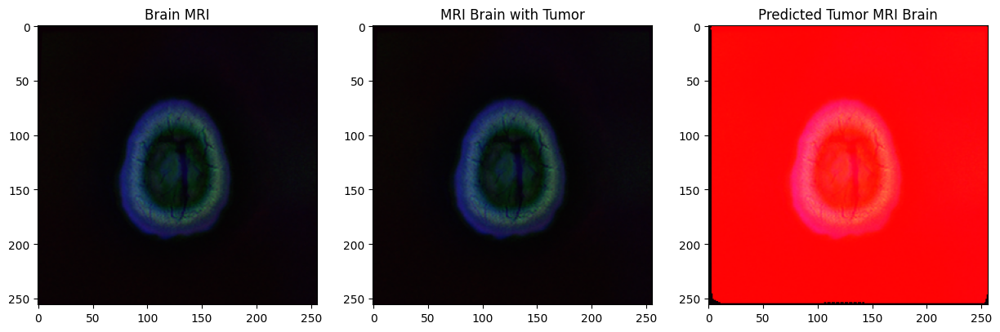

1/1 [==============================] - 0s 27ms/step


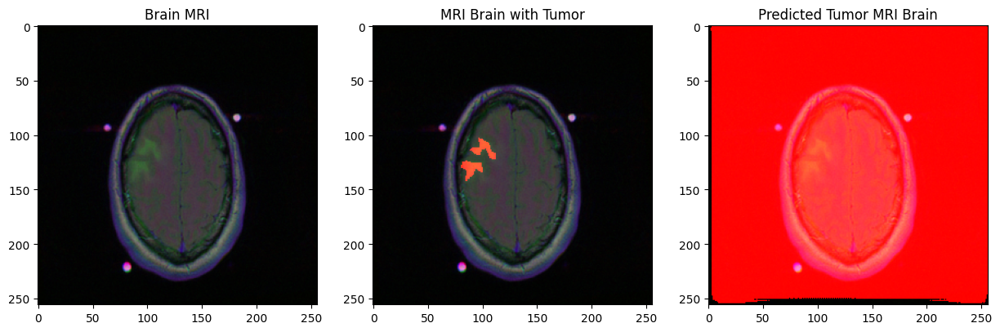

1/1 [==============================] - 0s 25ms/step


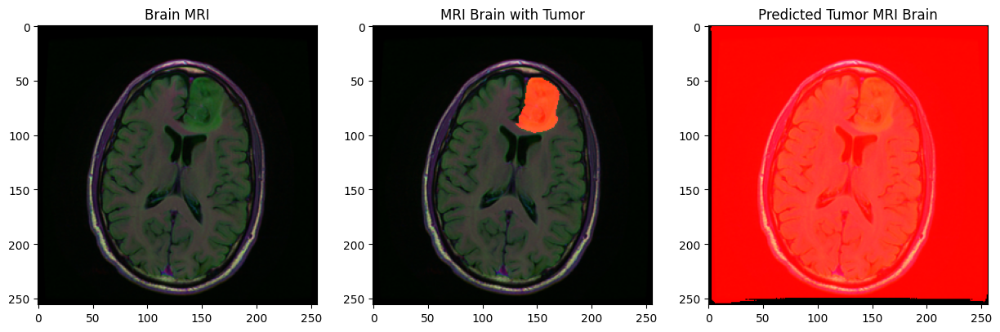

1/1 [==============================] - 0s 26ms/step


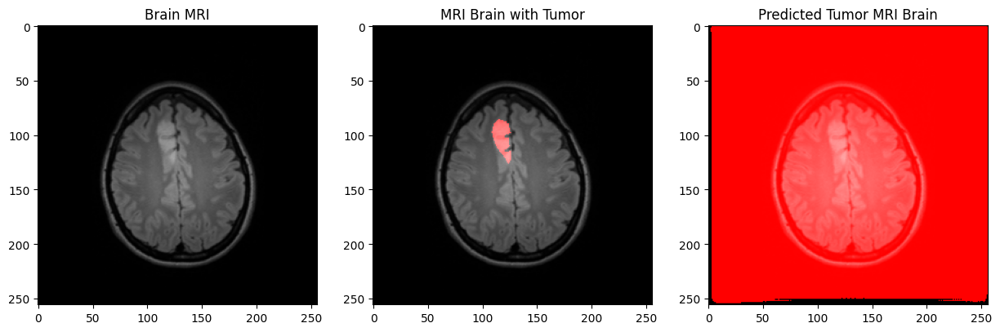

1/1 [==============================] - 0s 25ms/step


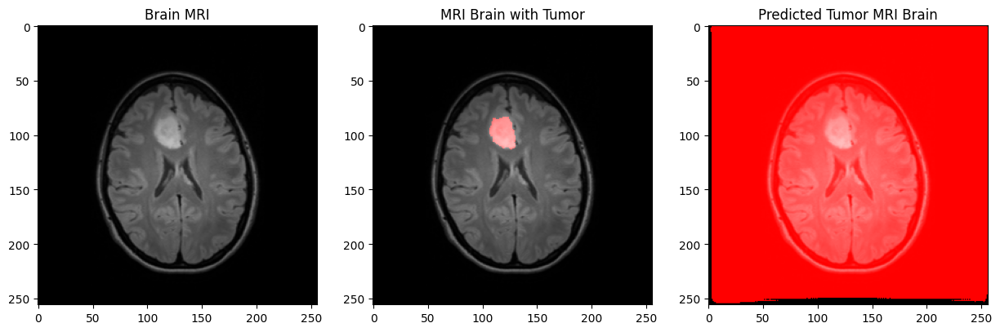

1/1 [==============================] - 0s 26ms/step


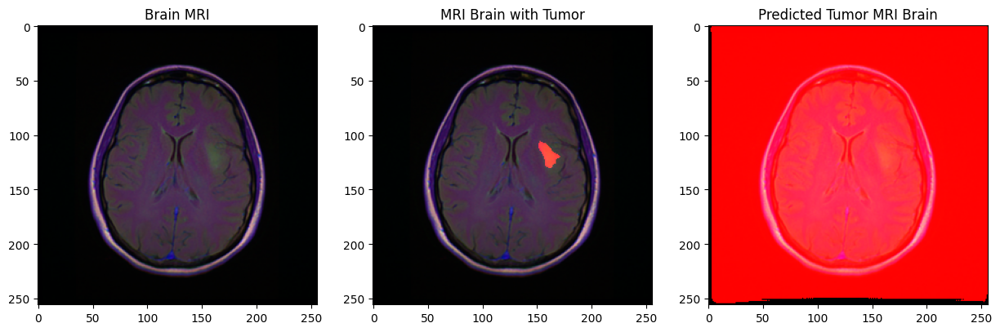

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

for i in range(1, 40, 2):
    img_path_test = test.iloc[i, 0]
    msk_path_test = test.iloc[i, 1]
    
    # Read and preprocess the image
    img = cv2.imread(img_path_test)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (im_height, im_width))
    img = img / 255.0
    img = img[np.newaxis, :, :, :]
    
    # Read the mask and get predictions
    msk = cv2.imread(msk_path_test)
    pred = model.predict(img)  # predictions
    img = np.squeeze(img)
    
    # Prepare figures for plotting
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original Brain MRI
    ax[0].imshow(img)
    ax[0].set_title("Brain MRI")
    
    # MRI with ground truth mask
    main = np.copy(img)  # Create a copy of the image
    label = cv2.imread(msk_path_test, cv2.IMREAD_GRAYSCALE)
    sample = np.array(np.squeeze(label), dtype=np.uint8)
    contours, _ = cv2.findContours(sample, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    mask_overlay_gt = np.zeros_like(img)  # Create a blank canvas
    mask_overlay_gt = cv2.drawContours(mask_overlay_gt, contours, -1, (255, 0, 0), thickness=-1)
    mask_overlay_gt = np.clip(mask_overlay_gt + img, 0, 1)  # Overlay mask on image
    ax[1].imshow(mask_overlay_gt)
    ax[1].set_title("MRI Brain with Tumor")
    
    # MRI with predicted mask
    main = np.copy(img)  # Create a copy of the image
    pred_mask = np.array(np.squeeze(pred) > 0.5, dtype=np.uint8)
    contours, _ = cv2.findContours(pred_mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    mask_overlay_pr = np.zeros_like(img)  # Create a blank canvas
    mask_overlay_pr = cv2.drawContours(mask_overlay_pr, contours, -1, (255, 0, 0), thickness=-1)
    mask_overlay_pr = np.clip(mask_overlay_pr + img, 0, 1)  # Overlay mask on image
    ax[2].imshow(mask_overlay_pr)
    ax[2].set_title("Predicted Tumor MRI Brain")
    
    plt.show()
